<a href="https://colab.research.google.com/github/Vasudeva-bit/Dog-Breed-Identification-Transfer-Learning/blob/main/Dog_Vision_MultiClass_Breed_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Multi-Class Dog Breed Prediction using Transfer Learning with tensorflow and tensorflow hub. I gonna go building an end-to-end deep learning model on dog breed prediction.
### Problem statement
The project is a competition challenge on kaggle, the challenge is to build a machine learning model to predict the breed of a dog based on dog image as input. There are in total 120 breeds and their classification.
I will leave a resource to find more about the challenge :
https://www.kaggle.com/c/dog-breed-identification
### Data
I am going to use the same data given by kaggle on original competition and gonna build a model with that.
The direct resource to the data is :
https://www.kaggle.com/c/dog-breed-identification/data
### Evaluation
As kaggle I shall also evaluate the model on multi-class log loss instead of the accuracy, which is the most preferred metrics on classification.
### Features
The model/pre-trained model gonna fit on the given train data and get some insights and predict on the test data. Since the data is unstructured, we use the deep learning/transfer learning. 
* There are 10,000+ train data
* There are 10,000+ test data.

#### Getting environment ready
* Data
* Packages like tensorflow, pandas and etc..

In [ ]:
# Mounting data from google drive.!
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip drive/MyDrive/dog-breed-classification/dog-breed-identification.zip > /dev/null

In [ ]:
# Importing all packages needed in the project.
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Imporing specific tensorflow package
# try :
#   %tensorflow_version 2.x
# except Exception :
#   pass

In [ ]:
# Let us know the version that we are going to work on!!
print('tensorflow version: ',tf.__version__)
print('tensorflow_hub: ', hub.__version__)

tensorflow version:  2.6.0
tensorflow_hub:  0.12.0


In [ ]:
# We shall check our physical devies connected to the runtime (checking the GPU connection)..!
print('GPU availabity status :', 'Availabe' if tf.config.list_physical_devices("GPU") else 'Not available') 

GPU availabity status : Availabe


### Let us leap into data exploration

In [ ]:
labels = pd.read_csv('/content/labels.csv')

In [ ]:
labels.describe

<bound method NDFrame.describe of                                      id                     breed
0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
2      001cdf01b096e06d78e9e5112d419397                  pekinese
3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
...                                 ...                       ...
10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever

[10222 rows x 2 columns]>

In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels.id.value_counts()
# There are 10222 unique images in labels.csv file.
# It is ensured that the number of images in train set is same as of labels in labels.csv

aec5d7550b6fb110ce6b1adda05dffb1    1
ccbf2d7da8e85a3b60eb0ff8a87af58f    1
a019849fb9cd376e41fca11bd5808eae    1
9cb7daea9f8c91fbcb0c021b80e30092    1
952ee6aa4050c9593c2bcb2baf54b266    1
                                   ..
61f663ab9aa9c3cc41f207be4d4fd9e9    1
1553cf296f4d83f015a07afde78fd747    1
acd9f4e9537a1a4474024393ecfbe456    1
e3dac9d6f0bf998d55b310d37f5d4a27    1
eeca7236c506c6c3e4405c959944f3c1    1
Name: id, Length: 10222, dtype: int64

In [ ]:
labels.breed.value_counts()
# There are total 120 different dog breed class with 80 avg images to each class to train the model.

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
brabancon_griffon        67
komondor                 67
golden_retriever         67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [ ]:
# Let us know the number of images availble on average to each dog breed class
np.median(labels.breed.value_counts())

82.0

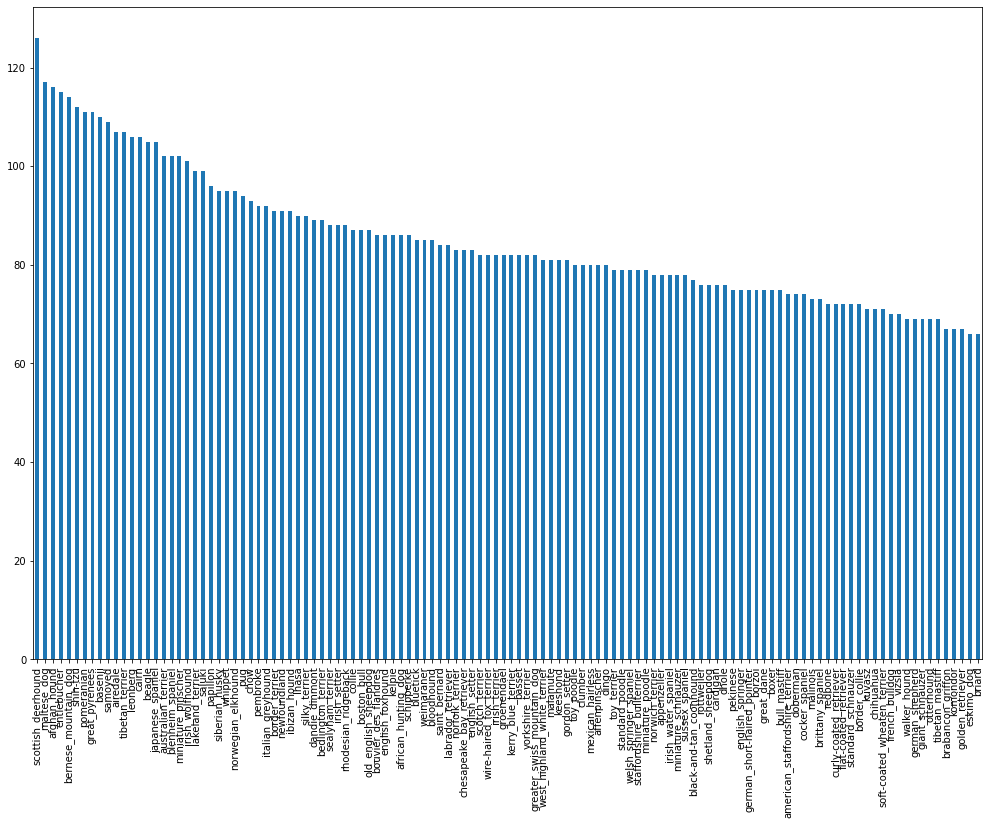

In [ ]:
# We shall visualise the number of images available to each breed class to train our model
labels.breed.value_counts().plot.bar(figsize = (17,12));

Note: It is obvious that any model perfoms well on dog breed predictions if the no of images for the model to train on the breed are relatively high.
As google says "Minimum of 10 images to any class in a classification model is must and 100 is appreciable".

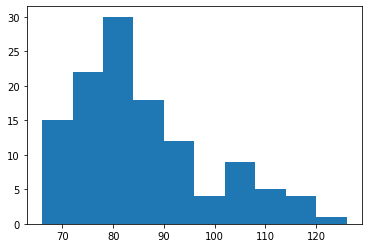

In [ ]:
# We shall check the normal distribution of the images to each class of dog breed.
plt.hist(labels.breed.value_counts());

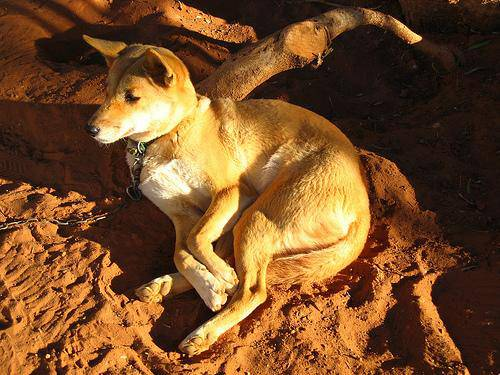

In [ ]:
# Lets view an image
from IPython.display import Image
Image('/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

#### Lets get all the image file names and labels
So that we can refer to the list any time in future.

In [ ]:
Filenames = ['/content/train/'+fname+'.jpg' for fname in labels.id]
# Let's have a look at the first 10 image file names
Filenames[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Let us make sure that the number of images in train set matches with the number of labels in labels.csv, so that we can work on accurately evaluated model
import os 
if len(os.listdir('/content/train')) == len(Filenames) :
  print('The no of images in train folder are same as no of labels so we can PROCEED!!')
else :
  print('The no of images in train folder are not same as no of labels so first look into that before modelling .')

The no of images in train folder are same as no of labels so we can PROCEED!!


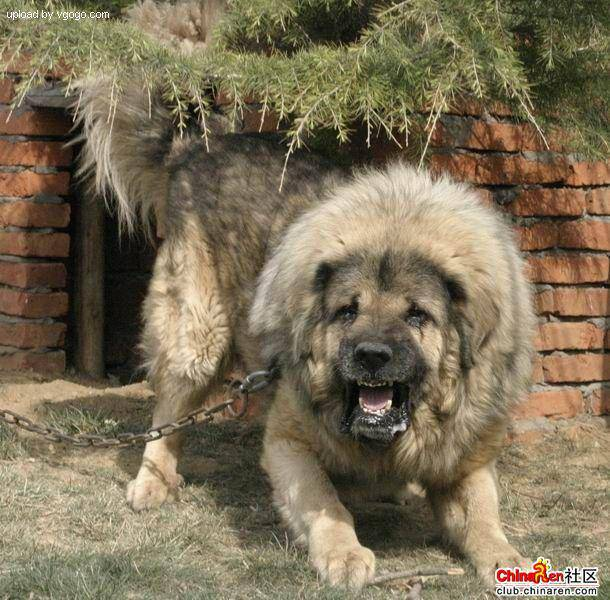

In [ ]:
Image(Filenames[9000])

In [ ]:
labels['breed'][9000]

'tibetan_mastiff'

#### We got our file names and lets prepare labels

In [ ]:
# Accessing the breed names of the train set into a numpy array.
import numpy as np
unique_labels = np.unique(labels['breed'])
actual_labels = np.array(labels['breed'])
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
actual_labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
# Let us convert the breed name of first breed into bool values 
bool_labels = actual_labels[0] == unique_labels
bool_labels

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Now similarly we shall convert all image labels into bool values specifically into the form of 1's and 0's.
bool_labels = [(label == unique_labels).astype(int) for label in actual_labels]

In [ ]:
len(bool_labels)

10222

In [ ]:
len(bool_labels[0])

120

In [ ]:
print(actual_labels[2])
bool_labels[:5]

pekinese


[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
# Trying to get the things on print i.e., checking that we are processing our labels
print(np.where(bool_labels[0])) # Returns the position of 1 in the array.
print(actual_labels[0]) # Returns the breed name of first image label.
print(bool_labels[0].argmax()) # Returns where the list has max value and in bool the max value is 1.

(array([19]),)
boston_bull
19


In [ ]:
Filenames[:10]
# The file names are not yet preprocessed so we shall do them into tensors using tensorflow.

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

#### Creating a Validation set since Kaggle dataset does not provide with the same. In dataset, we can find only train and test.

In [ ]:
# Set up X, y
X = Filenames
y = bool_labels

In [ ]:
len(Filenames)

10222

#### We will reduce the data that we use on experimenting
After getting a logical point we can extend our model on full data.

In [ ]:
# Set number of images to use for experiments
NUM_IMAGES = 1000 #@param{type :"slider", min: 1000, max: 10000, step : 1000}

In [ ]:
# Let us now split data into train and valid using sklearn
from sklearn.model_selection import train_test_split
# Let us split the data
X_train, X_valid, y_train, y_valid = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size = 0.2,
                                                    random_state= 42) # Same as np.random.seed(42)
# Let us make sure we are working on exact dimensions of data
len(X_train), len(y_train), len(X_valid), len(y_valid)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['/content/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
  array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

#### Preprocessing images and labels into tensors (kinda of Numpy array in tensorflow)

In [ ]:
# Before, actually diving into building a preprocessing function on images, we shall look into converting image into numpy array and then into tensors
from matplotlib.image import imread
image = imread(Filenames[42]) # Accessing a random image and converting into numpy array
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
image.shape
# 3, at end refers to RGB colors on the image.

(257, 350, 3)

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
# Converting numpy array of the image into tensors so that we, can apply on GPU.
tensor = tf.constant(image)
tensor[:2]
# We got the same values in both numpy array of the image and tensor but only diff is that we can use numvy on CPU but tensor enable us to use GPU

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
# Get the numpy values of image using tensorflow
image = tf.io.read_file(Filenames[42])
image 
# The tensor form made by tensorflow from numpy array.

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
# Getting the tensor form of the image int like numpy numeric values
image = tf.image.decode_jpeg(image)
image

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 54, 105,  64],
        [ 56, 107,  66],
        [ 62, 113,  72],
        ...,
        [ 70, 127,  82],
        [ 71, 128,  83],
        [ 72, 129,  84]],

       ...,

       [[  2,  11,  10],
        [  4,  13,  10],
        [  6,  15,  12],
        ...,
        [119, 112,  66],
        [125, 119,  71],
        [121, 115,  67]],

       [[  0,   3,   7],
        [  0,   7,   9],
        [  2,   8,   4],
        ...,
        [104,  97,  51],
        [111, 104,  58],
        [109, 102,  56]],

       [[ 16,  18,  30],
        [ 14,  19,  23],
        [ 15,  20,  13],
        ...,
        [ 99,  92,  4

In [ ]:
# Image standard size setting up
IMAGE_SIZE = 224
# Grand Function to carry out all the preprocessing methods on images using different tensorflow methods and classes
def preprocessing(image_file) :
  '''
  The function takes image file path as input all perform some preprocessing on images like :
  1. Input image using file_path.
  2. Converts image into tensors.
  3. Normalize the tensors from 1-255 to 0-1.
  4. Resize the image into a standard and common size which is 224*224.
  5. Return processed image.
  '''
  # Step 1: access image using file path
  image = tf.io.read_file(image_file)
  # Step 2: Converting numpy from of image into tensors with 3 channels
  image = tf.image.decode_jpeg(image, channels = 3)
  # Step 3: Normalizing the image pixel values.
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Step 4: Resizing all images into a standart shape
  image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])
  
  # Return image
  return image

In [ ]:
preprocessing(Filenames[42])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

#### Splitting data into training batches 
Since we can not train all 10k images into model at one go as patterns does not get fit into memory, so we shall a batch size to train our model eventually.
* Before preparing the training batches we shall prepare tuples of tensors with both labels and images and then divide train data in the form of batches.

In [ ]:
# A small function to make image tensor and labels into a tuple.
def tupler(image_file, label) :
  '''
  In takes the image file path and then zip the image tensor and label into a tuple.
  '''
  image = preprocessing(image_file)
  return image, label

In [ ]:
tupler(Filenames[42], bool_labels[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

#### Dividing data into data batchs as memory can not fit on all data at once.
Using tensorflow to do data into data batches

In [ ]:
# A Grand Function to divide the data either test, train, valid into data batches.
# Shuffling the train set only to make sure the model does not learn form sequence of the set.
BATCH_SIZE = 32
def create_data_batchs(X, y = None, valid_data = False, test_data = False) :
  '''
  The function takes the data as input and prepares data bathcs using tensorflow based on type of set either train or test or valid.
  '''
  # If the data which we need to turn to batchs is test data
  if test_data :
    print('preparing the test data into batchs')
    # Creating the data as tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    # Making batchs
    data = data.map(preprocessing).batch(BATCH_SIZE)
  # If the data which we need to turn to batchs is valid data
  elif valid_data :
    print('preparing the valid data into batchs')
    # Creating the data as tesors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                              tf.constant(y)))
    # Making batchs
    data = data.map(tupler).batch(BATCH_SIZE)
  # If the data which we need to turn to batchs is train data
  else :
    print('preparing the train data into batchs')
    # Creating the data as tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    # Shuffling the data before making them batchs is to reduce the time for it.
    data = data.shuffle(buffer_size = len(X))
    # Making batchs
    data = data.map(tupler).batch(BATCH_SIZE)
 # Lets return the data ready for experimenting
  return data
  

In [ ]:
train_data = create_data_batchs(X_train, y_train)
valid_data = create_data_batchs(X_valid, y_valid, valid_data = True)

preparing the train data into batchs
preparing the valid data into batchs


In [ ]:
# Let see how the data looks
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)))

#### Visualising the train and validation batchs.
Since understanding/comprehending the tensor form of images is tough, we make it simpe by visualising the batchs

In [ ]:
import matplotlib.pyplot as plt
# Function to plot images.
def visualise_first_25(images, labels) :
  '''
  This function intakes the image tensors and labels, giving us the original image with breed name
  '''
  plt.figure(figsize = (15,10))
  # Create subplots of 5*5 to visualise first 25 from a batch
  for i in range(25) :
    ax = plt.subplot(5, 5, i+1)
    # Visualising the image 
    plt.imshow(images[i])
    # Giving title to image as breed of the dog
    plt.title(unique_labels[labels[i].argmax()])
    # Putting off the grid lines on the images
    plt.axis('off')


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.38872412, 0.31401366, 0.24490407],
          [0.34127167, 0.26748177, 0.19745165],
          [0.33463466, 0.261128  , 0.19081464],
          ...,
          [0.51873404, 0.38953468, 0.31491867],
          [0.36408493, 0.26390997, 0.19664802],
          [0.32757416, 0.23737806, 0.16678981]],
 
         [[0.48049065, 0.39498505, 0.31705472],
          [0.4096425 , 0.32593727, 0.24530634],
          [0.4382879 , 0.35513666, 0.2736748 ],
          ...,
          [0.54546565, 0.4250069 , 0.34622014],
          [0.46412587, 0.37512034, 0.3039368 ],
          [0.40209922, 0.31974626, 0.24523647]],
 
         [[0.4753361 , 0.37460956, 0.2856477 ],
          [0.38207793, 0.28135136, 0.19238953],
          [0.35665888, 0.25593233, 0.16697048],
          ...,
          [0.62272424, 0.52221656, 0.44255096],
          [0.6232614 , 0.53881466, 0.4653518 ],
          [0.60090685, 0.5185539 , 0.44404408]],
 
         ...,
 
         [[0.69509447, 0.6558787 , 0.5499964 ],
          [0.70785

In [ ]:
len(train_images), len(train_labels)
# Since the batch size is 32

(32, 32)

In [ ]:
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
valid_images, valid_labels

(array([[[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.2770141 , 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
 
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
 
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
 
         ...,
 
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.99153

In [ ]:
len(valid_images), len(valid_labels)
# Since our batch size is 32

(32, 32)

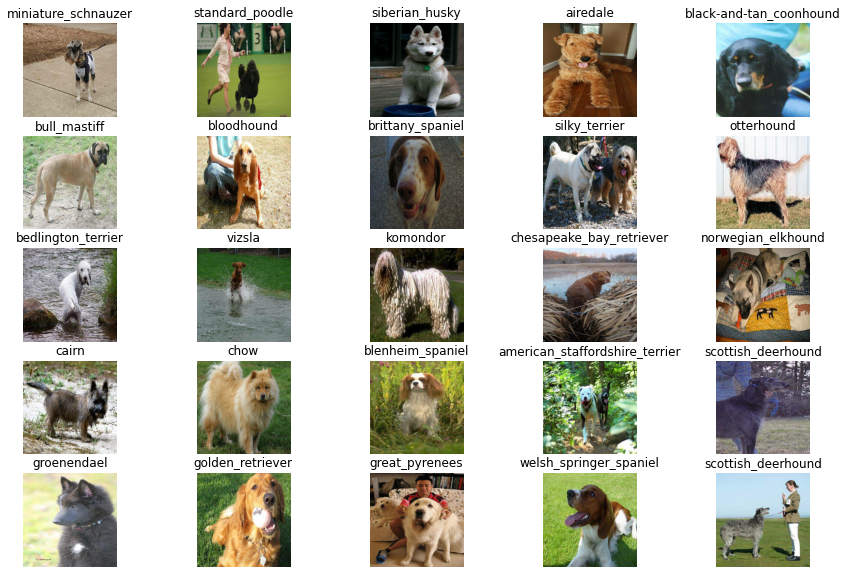

In [ ]:
# Lets see the train images
visualise_first_25(train_images, train_labels)

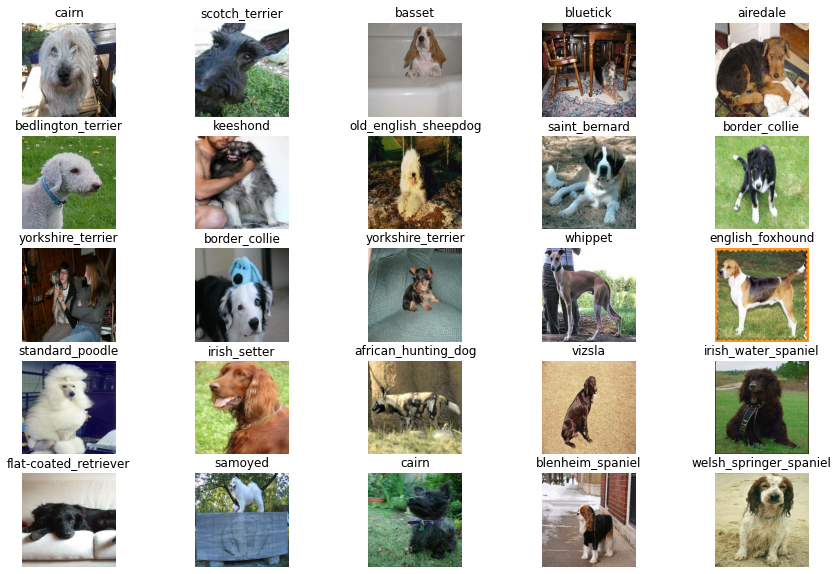

In [ ]:
# Visualise valid images
visualise_first_25(valid_images, valid_labels)

#### Buiding a model
* Before building a model we need to define certain things like:
1. Input shape of the model,
2. Output shape of the model,
3. Model URL (i.e., the url of the model on tensorflow hub, which we will be using.)

In [ ]:
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3] # Defining along with the channels
OUTPUT_SHAPE = len(unique_labels)
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5' # From tensorflow hub (Solving this problem using Transfer learning)

We are ready with the Input shape, Output shape and model url and now we can create a function that sets up a deep learning model so that we can use that in our classification problem upon fine tuning.
Function carry out :
1. Takes in the input shape and output shape along with model url.
2. Crete a model with input and output layers using tensorflow and tensorflow hub.
3. Compiles the model with different parameters (Evaluation purpose)
4. Builds the model and 
5. Returns the model.
All the steps followed are direct framework of keras api of tensorflow overview section. the link :
https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Another Grand function to build up the model
def Modeler(INPUT_SHAPE = INPUT_SHAPE, OUTPUT_SHAPE = OUTPUT_SHAPE, MODEL_URL = MODEL_URL) :
  # Configuring the model and its layers using tensorflow hub since we are using
  print('Buiding the model with model in url', MODEL_URL)
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), # Defining input shape to first layer
                               tf.keras.layers.Dense(units = OUTPUT_SHAPE, # Defining input shape to second layer
                                                     activation = 'softmax') # Activation function
  ])
  # Compile the model
  model.compile(loss = tf.keras.losses.CategoricalCrossentropy(), 
                optimizer = tf.keras.optimizers.Adam(), 
                metrics = ['accuracy'])
  # Buiding the model
  model.build(INPUT_SHAPE)
  # Returning the model
  return model

In [ ]:
model = Modeler()
model.summary()

Buiding the model with model in url https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


#### Setting up Call backs
We can set call backs in tensorflow to check, track, and stop training of the model based on its learning and learning rate using call backs
The main two call backs, that can help are Tensor Board and stop training if the model is not improving before complete training, so that we can reduce the cost and time.
#### Tensor Board Call Back
The call back function contains so carryouts the below:
1. Load TensorBoard using magic function
2. Create a call back tensorboard function which can save the logs to a logs directory and pass the logs to fit () function.
3. Visualise the model training logs.

In [ ]:
# Import the TensorBoard using magic function
% load_ext tensorboard

In [ ]:
# Importing datatime to store logs w.r.t datatime
import datetime
# Create a function to create and save logs and return the logs to file w.r.t datatime info.
def create_tensorboard_callback() :
  logdir = os.path.join('/content/logs', 
                         # Making sure that the logs are tracked properly using datatime as refernce
                         datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early Stop Callback
We use the custom call back of the keras api to terminate the training of a model if the model does not improve on training for certain number  of epochs that we decide in call back initialization under patience attribute of the call back inistializer.
The link to resource is :
https://keras.io/api/callbacks/early_stopping/

In [ ]:
# Setting up early stop call back
Early_stop_callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy', 
                                                       patience = 3)

### Training  model
Function to instantiate the call backs and other helper funcitons to create the model and get ready to trian on train and valid data.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, steps:10}

In [ ]:
# Create a function to get the model ready to train
def train_model() :
  # Instantiating the call backs(TensorBoard)
  tensorboard = create_tensorboard_callback()
  # Create the model layout of the layer using mobilenet 
  model = Modeler()
  # Fitting the model
  model.fit(x = train_data, 
            epochs = NUM_EPOCHS, 
            validation_data = valid_data, 
            validation_freq = 1, 
            callbacks = [tensorboard, Early_stop_callback])
  # Returning the model
  return model

In [ ]:
model = train_model()

Buiding the model with model in url https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 40s 220ms/step - loss: 4.5776 - accuracy: 0.0938 - val_loss: 3.5611 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 161ms/step - loss: 1.6243 - accuracy: 0.6950 - val_loss: 2.3043 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 4s 159ms/step - loss: 0.5683 - accuracy: 0.9388 - val_loss: 1.7043 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 4s 159ms/step - loss: 0.2532 - accuracy: 0.9912 - val_loss: 1.5198 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 136ms/step - loss: 0.1443 - accuracy: 0.9962 - val_loss: 1.4419 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 160ms/step - loss: 0.0996 - accuracy: 0.9987 - val_loss: 1.3954 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============

#### Overfitting
* The model is overfitting so, it is needed to prevent overfitting with some techniques like adding dropout layers or so, but atleast the model is currently learning and finding some patterns
##### Evaluating the model using tensorboard
Before jumping on to solving the overfitting issue, going through the performance of the model is better

In [ ]:
# Using tensorboard to visualise the logs obtained from tensorboard call back
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

##### Predictions on valid_data
Using the predict function of tensorflow we can get the prediction probabilities.

In [ ]:
predictions = model.predict(valid_data, verbose = 1)
predictions.shape

7/7 [==============================] - 1s 106ms/step


(200, 120)

In [ ]:
# Visualising and converting predictions in probabilities into breed class using unique_breed
index = 0
# For only first image of the valid set
print(predictions[index])
print(f'The Sum of the predictions since it is softmax {np.sum(predictions[index])}')
print(f'The max probability is {np.max(predictions[index])}')
print(f'The index of max probabity is {np.argmax(predictions[index])}')
print(f'The breed most close to image is {unique_labels[np.argmax(predictions[index])]}')

[3.82866873e-03 6.55336597e-04 1.07394189e-04 7.47454906e-05
 2.58363638e-04 4.49478503e-05 3.17826755e-02 8.70986725e-04
 2.05619246e-04 2.79705483e-03 8.69740383e-04 7.27706822e-04
 2.56709260e-04 1.23787031e-04 1.07624324e-03 3.13637138e-04
 3.57496203e-04 3.51033174e-02 8.45241739e-05 3.50986375e-04
 2.71993782e-03 2.09814127e-04 2.24710559e-04 5.47062780e-04
 4.10403518e-05 4.66388330e-04 8.05775747e-02 4.29703541e-05
 7.42845121e-04 2.10009617e-04 1.13065726e-04 8.29103868e-03
 4.67501610e-04 3.68432811e-05 5.78003310e-05 4.17968398e-03
 3.38378450e-05 1.06440228e-03 8.30800564e-05 1.59410367e-04
 1.20561232e-03 7.01454774e-05 1.57339367e-04 8.55374819e-05
 8.82990353e-05 2.53124686e-04 3.35174409e-05 9.26639827e-04
 1.06466876e-03 3.77463410e-04 6.52426243e-05 1.67683873e-04
 1.76550006e-04 1.57764123e-04 1.64767625e-04 6.23855885e-05
 2.51570513e-04 1.04692287e-03 1.14711130e-03 2.56327540e-01
 3.63648869e-04 3.95783194e-04 9.53918352e-05 1.07693668e-04
 6.25263026e-04 9.086624

In [ ]:
# Functionisng the above code to get the actual labels of image predicted by model from its predict_proba predictions
def gen_text_labels(prediction_proba) :
  '''
  The function takes in the prediction probabilities of an valid or test image gives the actual text label or breed name
  '''
  return unique_labels[np.argmax(prediction_proba)]
# Checking the function workflow
predict_breed = gen_text_labels(predictions[0])
predict_breed

'irish_wolfhound'

##### Unbatching the data to evaluate the model predictions with the actual labels.

In [ ]:
# Function to unbatch the data
def unbatchify(data) :
  '''
  The function takes the data and using tensorflow unbatchs the data into two iterables
  '''
  images = []
  labels = []
  # Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator() :
    # Appending the imagese
    images.append(image)
    # Appending the labels
    labels.append(label)
  return images, labels

In [ ]:
# Unbatching the valid data
val_images, val_labels = unbatchify(valid_data)
# Checking out and comparing the actual and predicted label on first dog image of valid_data to just see the working of the model
unique_labels[np.argmax(val_labels[0])], unique_labels[np.argmax(predictions[0])]

('cairn', 'irish_wolfhound')

* The model has predicted wrong on very first image so improvement needed but for now, visualising whole predictions v/s actauls and evaluating is more important
##### The function takes in the image, labels to get us a plot

In [ ]:
# Visualising the images, labels using a function
def pred_plot(predict_proba, image, label, n= 1) :
  '''
  The function that takes in the predictions, labels and images to give the plot
  '''

  # Assigning values
  predict_proba = predict_proba[n]
  label = label[n]
  image = image[n]

  # Deciding the color coding based on prdiction of the model
  if unique_labels[np.argmax(predict_proba)] == unique_labels[np.argmax(label)] :
    color = 'green'
  else :
    color = 'red'
    
  # Ploting for the image and labels
  plt.imshow(image)
  plt.title('{} {} {}'. format(unique_labels[np.argmax(predict_proba)], 
                                    np.max(predict_proba), 
                                    unique_labels[np.argmax(label)]), 
            color = color)
  plt.xticks([])
  plt.yticks([])
  

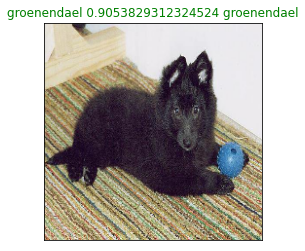

In [ ]:
pred_plot(predict_proba= predictions, 
          image= val_images, 
          label= val_labels, 
          n= 77)

##### Another way to visualise the performance of the model using top 10 best probabilities predicted by model.
Bulding a model that does:
1. Get predictions using get_text_labels
2. Take the top 10 best probabilities prediction of classes by the model
3. Take the top 10 labels i.e., the original breed class names.
And compare with the original breed on a bar graph

In [ ]:
def pred_10_bar(predict_proba, label, n =1) :
  '''
  The function takes in the image and returns the predicted probabilites of each class using model and represent them on a bar plot.
  '''

  # Getting models predictions on taken index
  predict_proba, label = predict_proba[n], label[n]

  label = unique_labels[np.argmax(label)]
  # Getting the top 10 prediction probabilities
  ten_probabilities = predict_proba[np.argsort(predict_proba)[-10:][::-1]]

  # Getting the indexes of the top 10 high probabilities breed classes
  ten_index = np.argsort(predict_proba)[-10:][::-1]

  # Create a bar plot
  bar_plot = plt.bar(np.arange(len(ten_index)), # This says no of bar plots on single window or frame
                    ten_probabilities, 
                    color= 'grey') # bar_plot contains a list of bar plot objects whose setting can be change like we can change the color of single bar plot by slicing bar plot object and setting the specific one to customized color
  
  plt.xticks(np.arange(len(ten_index)), 
                       labels= ten_probabilities, 
                       rotation= 'vertical')
  
  # Change the color of bar plot to green with correct breed class in top 10
  if np.isin(label, unique_labels[ten_index]) :
    bar_plot[np.argmax(label == unique_labels[ten_index])].set_color('green')

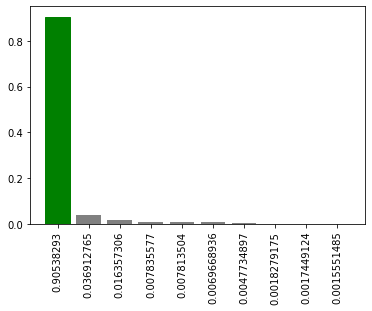

In [ ]:
pred_10_bar(predict_proba= predictions, 
            label= val_labels, 
            n= 77)

#### Ultimate visulisation of dogs and prediction

<function matplotlib.pyplot.show>

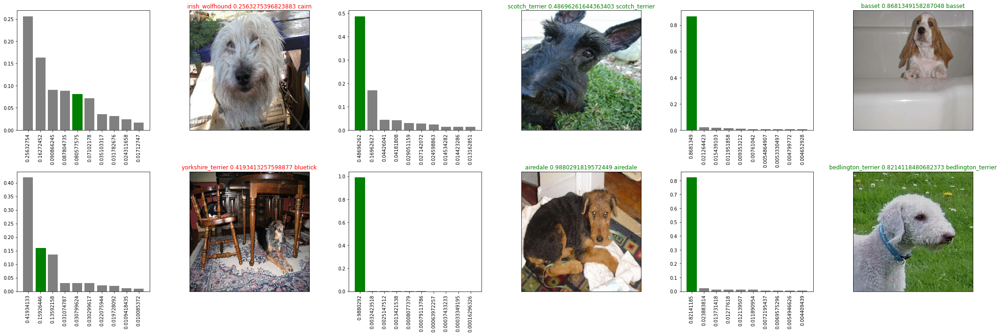

In [ ]:
i_multiplier = 0
num_rows= 2
num_cols= 3
num_images= num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images) :

  # Create a subplot layout
  plt.subplot(num_rows, num_cols*2, 2*i+1)
  pred_10_bar(predict_proba=predictions, 
              label= val_labels, 
              n= i+i_multiplier)
  plt.subplot(num_rows, num_cols*2, 2*i+2)
  pred_plot(predict_proba= predictions, 
            image= val_images, 
            label= val_labels, 
            n= i+i_multiplier)
plt.tight_layout(h_pad= 1.0)
plt.show
  

#### Saving and Reloading model

In [ ]:
def model_save(model, suffix= None) :
  '''
  The function takes in the model and valid suffix the saves the model to give path with suffix
  '''
  
  # Defining the directory address
  model_dir = os.path.join('content/train_model_ready_to_use', 
                           datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  
  # Defining suffix to file name
  model_path = model_dir + '-' + suffix + '.h5' # '.h5' is to signify that we gonna save a trained model to a file
  print('Saving the model to ', model_path)
  # Saving the model
  model.save(model_path)


In [ ]:
def load_model(model_path) :
  '''
  The function takes in the model path and loads the model then return the model
  '''
  print('Loading the model from given path')
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects= {'KerasLayer': hub.KerasLayer})
  
   # Returning the model
  return model

In [ ]:
# Saving the model
model_save(model, 'model-trained-1000-images')

Saving the model to  content/train_model_ready_to_use/20210926-160439-model-trained-1000-images.h5


##### Reloading the model to check weather the model is saved correctly

In [ ]:
loaded_model = load_model('content/train_model_ready_to_use/20210926-160439-model-trained-1000-images.h5')

Loading the model from given path


In [ ]:
loaded_model.evaluate(valid_data)

7/7 [==============================] - 1s 107ms/step - loss: 1.3452 - accuracy: 0.6250


[1.345210075378418, 0.625]

In [ ]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 126ms/step - loss: 1.3452 - accuracy: 0.6250


[1.345210075378418, 0.625]

The pre-loaded and reloaded models are perfectly alright and are working great

### Working with full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Creating batchs from full data
full_data = create_data_batchs(X, y)

preparing the train data into batchs


In [ ]:
# Create the model for full data
full_model = Modeler()

Buiding the model with model in url https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Creating call backs for the full_data model 

# TensorBoard
tensorboard_call = create_tensorboard_callback()
# Early stopping call back
full_data_early_call = tf.keras.callbacks.EarlyStopping(monitor= 'accuracy', 
                                                    patience = 3)

**Note:** The next cell runs for almost 10 minutes to load all the images into GPU

In [ ]:
# Know the time to run or fit the model on full data
%%time
# Fitting the model with full data
full_model.fit(full_data, 
               epochs= NUM_EPOCHS, 
               callbacks= [tensorboard_call, full_data_early_call])

Epoch 1/100
320/320 [==============================] - 40s 112ms/step - loss: 1.3400 - accuracy: 0.6687
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.3964 - accuracy: 0.8819
Epoch 3/100
320/320 [==============================] - 34s 106ms/step - loss: 0.2320 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1543 - accuracy: 0.9640
Epoch 5/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1052 - accuracy: 0.9792
Epoch 6/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0784 - accuracy: 0.9857
Epoch 7/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0588 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0445 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0365 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 34s 106m

In [ ]:
# Saving the full data trained model
model_save(full_model, 'model-trained-full-data')

Saving the model to  content/train_model_ready_to_use/20210926-161712-model-trained-full-data.h5


#### Working out our model on the original test data
* Since our model has trained on the full train data set and ready to evaluate the model on the original test data given by kaggle using some of our build functions.
We can convert the image data of test directly into the batches using the functions we defined before,
1. We need to get access to all image file names in a variabel
2. Covernt the data into batchs and 
3. Make predictions on the batchs using the fully trained model.

In [ ]:
# Accesing the file names of all images in the test data.
test_filenames = ['/content/test/' + fname for fname in os.listdir('/content/test')]

In [ ]:
test_filenames[:10]

['/content/test/b5a43a4a1bd5b3fae022c5c6969d32b2.jpg',
 '/content/test/3470435e5fb943cd7d97054de8f33014.jpg',
 '/content/test/8b3c622300b7e50b38df7e19063dcac1.jpg',
 '/content/test/fc235032843333295c1e43551a715709.jpg',
 '/content/test/f62a52631ede45098ecce8fc96e0a2f6.jpg',
 '/content/test/c47e0c12f765f90467d5b4a5604a669a.jpg',
 '/content/test/68f1c5a8a18ef3b060514a6de813fa98.jpg',
 '/content/test/c8f0ae111e61e40d3396ed9db24deb07.jpg',
 '/content/test/a62318fe88e17d31efdf99f2334ede1c.jpg',
 '/content/test/c6798391ab8c68b17c06ee57bb4123f9.jpg']

In [ ]:
# Converting the test filenames into tensors and to batchs
test_data = create_data_batchs(test_filenames, test_data = True)

preparing the test data into batchs


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Making predictions on test data and saving it.
predictions = full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 33s 100ms/step


In [ ]:
np.savetxt('/content/results', predictions, delimiter= ',')

In [ ]:
test_predictions = np.loadtxt('/content/results', delimiter = ',')

#### Writing the predictions into csv file

In [ ]:
# Creating a Data Frame layout
test_df = pd.DataFrame(columns = ['ids']+list(unique_labels))
test_df

,ids,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(filename)[0] for filename in test_filenames]

In [ ]:
# Assigning the test_images id to id columns
test_df['ids'] = test_ids

In [ ]:
test_df[list(unique_labels)] = 
# Filling the probabilities values into the dataframe

In [ ]:
# Writting the prediction probalbilities as csv into a csv file.
test_df.to_csv('/content/drive/My Drive/Dog-Vision-submission.csv', index= False)

#### We can use the same model to find the breed of our custom dog images and for that the steps needed are:
1. Get the file paths
2. Convert them int to batches using defined function i.e., 'create_data_batchs'
3. Get the predictions of the model using 'model.predict()' and convert them to labels with our defined function 'get_pred_labels'
4. Visualise the images with their labels using new code with matplotlib imshow() fucntion.

### The End of this Incredible Dog Vision Project